In [1]:
from typing import Tuple, Union, Optional, List
import os
os.environ['HF_ENDPOINT'] = "https://hf-mirror.com"
import shutil
import copy
import math

import torch
import torch.nn as nn
from torch.optim.adamw import AdamW
from torch.optim.sgd import SGD
from torchvision import transforms
from torchvision.utils import save_image
from diffusers import StableDiffusionPipeline, UNet2DConditionModel
from diffusers import StableDiffusionAdapterPipeline, MultiAdapter, T2IAdapter
from diffusers.pipelines.t2i_adapter.pipeline_stable_diffusion_adapter import _preprocess_adapter_image
from transformers import CLIPProcessor, CLIPModel
from accelerate.utils import set_seed
from taming.modules.losses.vqperceptual import *
from taming.modules.losses.lpips import *
import numpy as np
from PIL import Image
import cv2
from tqdm.notebook import tqdm
from IPython.display import display, clear_output
from sklearn.decomposition import PCA

from utils.kvctrl import KVReplace, KVSelfReplace
from utils.masactrl import MutualSelfAttentionControlMaskAuto
from utils.attention import register_attention_editor_diffusers, AttentionBase

T = torch.Tensor
TN = Optional[T]
TS = Union[Tuple[T, ...], List[T]]

device = torch.device('cuda:3')
dtype = torch.float16


## Delta Denoising Score: zero-shot image editing

## Utils

In [82]:

def load_512(image_path: str, left=0, right=0, top=0, bottom=0):
    image = np.array(Image.open(image_path))[:, :, :3]    
    h, w, c = image.shape
    left = min(left, w-1)
    right = min(right, w - left - 1)
    top = min(top, h - left - 1)
    bottom = min(bottom, h - top - 1)
    image = image[top:h-bottom, left:w-right]
    h, w, c = image.shape
    if h < w:
        offset = (w - h) // 2
        image = image[:, offset:offset + h]
    elif w < h:
        offset = (h - w) // 2
        image = image[offset:offset + w]
    image = np.array(Image.fromarray(image).resize((512, 512)))
    return image

def load_512_mask(image_path: str, left=0, right=0, top=0, bottom=0):
    image = np.array(Image.open(image_path))
    if len(image.shape) == 3:
        image = image[:, :, :3]
    else:
        image = np.stack([image, image, image], axis=2)   
    h, w, c = image.shape
    left = min(left, w-1)
    right = min(right, w - left - 1)
    top = min(top, h - left - 1)
    bottom = min(bottom, h - top - 1)
    image = image[top:h-bottom, left:w-right]
    h, w, c = image.shape
    if h < w:
        offset = (w - h) // 2
        image = image[:, offset:offset + h]
    elif w < h:
        offset = (h - w) // 2
        image = image[offset:offset + w]
    image = np.array(Image.fromarray(image).resize((512, 512)).convert('L'))
    # to binary
    image = (image > 100).astype(np.uint8)
    return image


@torch.no_grad()
def get_text_embeddings(pipe: StableDiffusionPipeline, text: str) -> T:
    tokens = pipe.tokenizer([text], padding="max_length", max_length=77, truncation=True,
                                   return_tensors="pt", return_overflowing_tokens=True).input_ids.to(device)
    return pipe.text_encoder(tokens).last_hidden_state.detach()

@torch.no_grad()
def denormalize(image):
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.cpu().permute(0, 2, 3, 1).numpy()
    image = (image * 255).astype(np.uint8)
    return image[0]


@torch.no_grad()
def decode(latent: T, pipe: StableDiffusionPipeline, im_cat: TN = None):
    image = pipe.vae.decode((1 / 0.18215) * latent, return_dict=False)[0]
    image = denormalize(image)
    if im_cat is not None:
        if not isinstance(im_cat, list):
            im_cat = [im_cat]
        # change 2 dim to 3 dim
        im_cat = [np.repeat(np.expand_dims(im, 2), 3, axis=2) if len(im.shape) == 2 else im for im in im_cat]
        image = np.concatenate(im_cat + [image], axis=1)
    return Image.fromarray(image)

def decode_latent(latent: T, pipe: StableDiffusionPipeline):
    image = pipe.vae.decode((1 / 0.18215) * latent, return_dict=False)[0]
    image = (image / 2 + 0.5).clamp(0, 1)
    # image = denormalize(image)
    return image

def visualize_pca(feature_maps_fit_data: torch.Tensor, feature_maps_transform_data: torch.Tensor):

    feature_maps_fit_data = feature_maps_fit_data.reshape(1, -1).cpu().numpy()
    print(feature_maps_fit_data.shape)
    pca = PCA(n_components=3)
    pca.fit(feature_maps_fit_data)
    feature_maps_pca = pca.transform(feature_maps_transform_data.reshape(1, -1).cpu().numpy())  # N X 3
    # print(feature_maps_pca)
    # feature_maps_pca = feature_maps_pca.reshape(len(transform_experiments), num_frame, -1, 1).repeat(3, axis=-1) # K x F x (H * W) x 3
    feature_maps_pca = feature_maps_pca.reshape(1, -1, 3) # 1 x (H * W) x 3
    # print(feature_maps_pca.shape)
    H, W = math.sqrt(feature_maps_pca.shape[1]), math.sqrt(feature_maps_pca.shape[1])
    H, W = int(H), int(W)
    feature_maps_pca = feature_maps_pca.reshape(H, W, 3)
    
    return feature_maps_pca

In [3]:
def init_pipe(device, dtype, unet, scheduler) -> Tuple[UNet2DConditionModel, T, T]:
    
    with torch.inference_mode():
        alphas = torch.sqrt(scheduler.alphas_cumprod).to(device, dtype=dtype)
        sigmas = torch.sqrt(1 - scheduler.alphas_cumprod).to(device, dtype=dtype)
    for p in unet.parameters():
        p.requires_grad = False
    return unet, alphas, sigmas


class DDSLoss:
 
    def noise_input(self, z, eps=None, timestep: Optional[int] = None):
        if timestep is None:
            b = z.shape[0]
            timestep = torch.randint(
                low=self.t_min,
                high=min(self.t_max, 1000) - 1,  # Avoid the highest timestep.
                size=(b,),
                device=z.device, dtype=torch.long)
        # print(timestep)
        if timestep is not None and isinstance(timestep, int):
            timestep = torch.tensor([timestep] * z.shape[0], device=z.device, dtype=torch.long)
        if eps is None:
            eps = torch.randn_like(z)
        alpha_t = self.alphas[timestep, None, None, None]
        sigma_t = self.sigmas[timestep, None, None, None]
        z_t = alpha_t * z + sigma_t * eps
        return z_t, eps, timestep, alpha_t, sigma_t

    def get_eps_prediction(self, z_t: T, timestep: T, text_embeddings: T, alpha_t: T, sigma_t: T, get_raw=False,
                           guidance_scale=7.5):

        latent_input = torch.cat([z_t] * 2)
        timestep = torch.cat([timestep] * 2)
        embedd = text_embeddings.permute(1, 0, 2, 3).reshape(-1, *text_embeddings.shape[2:])
        # [2, 2, 77, 768] -> [4, 77, 768]
        with torch.autocast(device_type="cuda", dtype=torch.float16):
            e_t = self.unet(
                latent_input, 
                timestep, 
                embedd,
                down_intrablock_additional_residuals=[state.clone() for state in self.adapter_state] if self.use_adapter else None,
            ).sample
            if self.prediction_type == 'v_prediction':
                e_t = torch.cat([alpha_t] * 2) * e_t + torch.cat([sigma_t] * 2) * latent_input
            e_t_uncond, e_t = e_t.chunk(2)
            if get_raw:
                return e_t_uncond, e_t
            e_t = e_t_uncond + guidance_scale * (e_t - e_t_uncond)
            assert torch.isfinite(e_t).all()
        if get_raw:
            return e_t
        pred_z0 = (z_t - sigma_t * e_t) / alpha_t
        return e_t, pred_z0

    def get_sds_loss(self, z: T, text_embeddings: T, eps: TN = None, mask=None, t=None,
                 timestep: Optional[int] = None, guidance_scale=100) -> TS:
        with torch.inference_mode():
            z_t, eps, timestep, alpha_t, sigma_t = self.noise_input(z, eps=eps, timestep=timestep)
            e_t, _ = self.get_eps_prediction(z_t, timestep, text_embeddings, alpha_t, sigma_t,
                                             guidance_scale=guidance_scale)
            grad_z = (alpha_t ** self.alpha_exp) * (sigma_t ** self.sigma_exp) * (e_t - eps)
            assert torch.isfinite(grad_z).all()
            grad_z = torch.nan_to_num(grad_z.detach(), 0.0, 0.0, 0.0)
            if mask is not None:
                grad_z = grad_z * mask
            log_loss = (grad_z ** 2).mean()
        sds_loss = grad_z.clone() * z
        del grad_z
        return sds_loss.sum() / (z.shape[2] * z.shape[3]), log_loss

  
    def get_dds_loss(self, z_source: T, z_target: T, text_emb_source: T, text_emb_target: T,
                            eps=None, reduction='mean', symmetric: bool = False, calibration_grad=None, timestep: Optional[int] = None,
                      guidance_scale=7.5, raw_log=False) -> TS:
        with torch.inference_mode():
            z_t_source, eps, timestep, alpha_t, sigma_t = self.noise_input(z_source, eps, timestep)
            z_t_target, _, _, _, _ = self.noise_input(z_target, eps, timestep)
            eps_pred, _ = self.get_eps_prediction(torch.cat((z_t_source, z_t_target)),
                                                  torch.cat((timestep, timestep)),
                                                  torch.cat((text_emb_source, text_emb_target)),
                                                  torch.cat((alpha_t, alpha_t)),
                                                  torch.cat((sigma_t, sigma_t)),
                                                  guidance_scale=guidance_scale)
            eps_pred_source, eps_pred_target = eps_pred.chunk(2)
            grad = (alpha_t ** self.alpha_exp) * (sigma_t ** self.sigma_exp) * (eps_pred_target - eps_pred_source)
            if calibration_grad is not None:
                if calibration_grad.dim() == 4:
                    grad = grad - calibration_grad
                else:
                    grad = grad - calibration_grad[timestep - self.t_min]
            if raw_log:
                log_loss = eps.detach().cpu(), eps_pred_target.detach().cpu(), eps_pred_source.detach().cpu()
            else:
                log_loss = (grad ** 2).mean()
        loss = z_target * grad.clone()
        if symmetric:
            loss = loss.sum() / (z_target.shape[2] * z_target.shape[3])
            loss_symm = self.rescale * z_source * (-grad.clone())
            loss += loss_symm.sum() / (z_target.shape[2] * z_target.shape[3])
        elif reduction == 'mean':
            loss = loss.sum() / (z_target.shape[2] * z_target.shape[3])
        return loss, log_loss
    
    def get_masked_dds_loss(self, z_source: T, z_target: T, text_emb_source: T, text_emb_target: T,
                            eps=None, reduction='mean', symmetric: bool = False, calibration_grad=None, timestep: Optional[int] = None,
                      guidance_scale=7.5, raw_log=False, mask=None) -> TS:
        with torch.inference_mode():
            z_t_source, eps, timestep, alpha_t, sigma_t = self.noise_input(z_source, eps, timestep)
            z_t_target, _, _, _, _ = self.noise_input(z_target, eps, timestep)
            eps_pred, _ = self.get_eps_prediction(torch.cat((z_t_source, z_t_target)),
                                                  torch.cat((timestep, timestep)),
                                                  torch.cat((text_emb_source, text_emb_target)),
                                                  torch.cat((alpha_t, alpha_t)),
                                                  torch.cat((sigma_t, sigma_t)),
                                                  guidance_scale=guidance_scale)
            eps_pred_source, eps_pred_target = eps_pred.chunk(2)
            grad = (alpha_t ** self.alpha_exp) * (sigma_t ** self.sigma_exp) * (eps_pred_target - eps_pred_source)
            if calibration_grad is not None:
                if calibration_grad.dim() == 4:
                    grad = grad - calibration_grad
                else:
                    grad = grad - calibration_grad[timestep - self.t_min]
            if raw_log:
                log_loss = eps.detach().cpu(), eps_pred_target.detach().cpu(), eps_pred_source.detach().cpu()
            else:
                log_loss = (grad ** 2).mean()
        loss = z_target * grad.clone()
        if symmetric:
            if mask == None:
                loss = loss.sum() / (z_target.shape[2] * z_target.shape[3])
            else:
                loss = (loss * mask).sum() / (z_target.shape[2] * z_target.shape[3])
            loss_symm = self.rescale * z_source * (-grad.clone())
            loss += loss_symm.sum() / (z_target.shape[2] * z_target.shape[3])
        elif reduction == 'mean':
            if mask == None:
                loss = loss.sum() / (z_target.shape[2] * z_target.shape[3])
            else:
                loss = (loss * mask).sum() / (z_target.shape[2] * z_target.shape[3])
        return loss, log_loss
    
    def get_masked_inpaint_dds_loss(self, z_source: T, z_target: T, text_emb_source: T, text_emb_target: T,
                            eps=None, reduction='mean', symmetric: bool = False, calibration_grad=None, timestep: Optional[int] = None,
                      guidance_scale=7.5, raw_log=False, mask=None, iteration=3) -> TS:
        mean_pool = nn.AvgPool2d(5, stride=1, padding=2)
        def mean_n(origin, iteration):
            for _ in range(iteration):
                origin[mask <  1] = (mean_pool(origin) * (1 - mask))[mask < 1]
            return origin
        z_source = mean_n(z_source, iteration)

        with torch.inference_mode():
            z_t_source, eps, timestep, alpha_t, sigma_t = self.noise_input(z_source, eps, timestep)
            z_t_target, _, _, _, _ = self.noise_input(z_target, eps, timestep)
            eps_pred, _ = self.get_eps_prediction(torch.cat((z_t_source, z_t_target)),
                                                  torch.cat((timestep, timestep)),
                                                  torch.cat((text_emb_source, text_emb_target)),
                                                  torch.cat((alpha_t, alpha_t)),
                                                  torch.cat((sigma_t, sigma_t)),
                                                  guidance_scale=guidance_scale)
            eps_pred_source, eps_pred_target = eps_pred.chunk(2)
            grad = (alpha_t ** self.alpha_exp) * (sigma_t ** self.sigma_exp) * (eps_pred_target - eps_pred_source)
            if calibration_grad is not None:
                if calibration_grad.dim() == 4:
                    grad = grad - calibration_grad
                else:
                    grad = grad - calibration_grad[timestep - self.t_min]
            if raw_log:
                log_loss = eps.detach().cpu(), eps_pred_target.detach().cpu(), eps_pred_source.detach().cpu()
            else:
                log_loss = (grad ** 2).mean()
        loss = z_target * grad.clone()
        if symmetric:
            if mask == None:
                loss = loss.sum() / (z_target.shape[2] * z_target.shape[3])
            else:
                loss = (loss * mask).sum() / (z_target.shape[2] * z_target.shape[3])
            loss_symm = self.rescale * z_source * (-grad.clone())
            loss += loss_symm.sum() / (z_target.shape[2] * z_target.shape[3])
        elif reduction == 'mean':
            if mask == None:
                loss = loss.sum() / (z_target.shape[2] * z_target.shape[3])
            else:
                loss = (loss * mask).sum() / (z_target.shape[2] * z_target.shape[3])
        return loss, log_loss

    def change_cond_scale(self, scale: float):
        self.adapter_state = [state * scale for state in self.origin_adapter_state]

    def __init__(self, device, pipe: StableDiffusionPipeline, dtype=dtype, adapter: T2IAdapter=None, cond_images: List[Image.Image]=None, cond_scale: float=0.9):
        self.t_min = 50
        self.t_max = 950
        self.alpha_exp = 0
        self.sigma_exp = 0
        self.dtype = dtype
        self.unet, self.alphas, self.sigmas = init_pipe(device, dtype, pipe.unet, pipe.scheduler)
        self.prediction_type = pipe.scheduler.prediction_type
        
        self.use_adapter = False
        if adapter is not None and cond_images is not None:
            self.use_adapter = True
            
            assert len(cond_images) == 2
            
            image_inputs = [_preprocess_adapter_image(image, 512, 512).to(device=device, dtype=dtype) for image in cond_images]
            adapter_states = [adapter(image_input) for image_input in image_inputs]
            self.origin_adapter_state = adapter_states[0]
            self.adapter_state = adapter_states[0]
            for k in range(len(adapter_states[0])):
                v0 = adapter_states[0][k]    
                v1 = adapter_states[1][k]
                self.origin_adapter_state[k] = torch.cat([v0, v1, v0, v1], dim=0)
                self.adapter_state[k] = self.origin_adapter_state[k] * cond_scale


In [ ]:
model_id = "runwayml/stable-diffusion-v1-5"
# model_id = "pretrained/stable-diffusion-v2-1"
# model_id = "stabilityai/stable-diffusion-2-1"
# model_id = "pretrained/AnyLoRA"
pipeline = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=dtype,
).to(device)
pipeline.enable_attention_slicing()
pipeline.enable_vae_slicing()
pipeline.enable_xformers_memory_efficient_attention()

## Functions

###  Origin

In [5]:
def image_optimization(pipe: StableDiffusionPipeline, image: np.ndarray, text_source: str, text_target: str, num_iters=200, use_dds=True) -> None:
    dds_loss = DDSLoss(device, pipe)
    image_source = torch.from_numpy(image).float().permute(2, 0, 1) / 127.5 - 1
    image_source = image_source.unsqueeze(0).to(device, dtype=dtype)
    with torch.no_grad():
        z_source = pipeline.vae.encode(image_source)['latent_dist'].mean * 0.18215
        image_target = image_source.clone()
        embedding_null = get_text_embeddings(pipeline, "")
        embedding_text = get_text_embeddings(pipeline, text_source)
        embedding_text_target = get_text_embeddings(pipeline, text_target)
        embedding_source = torch.stack([embedding_null, embedding_text], dim=1)
        embedding_target = torch.stack([embedding_null, embedding_text_target], dim=1)

    image_target.requires_grad = True

    z_taregt = z_source.clone()
    z_taregt.requires_grad = True
    optimizer = SGD(params=[z_taregt], lr=1e-1)

    for i in range(num_iters):
        if use_dds:
            loss, log_loss = dds_loss.get_dds_loss(z_source, z_taregt, embedding_source, embedding_target)
        else:
            loss, log_loss = dds_loss.get_sds_loss(z_taregt, embedding_target)
        optimizer.zero_grad()
        loss *= 10
        (2000 * loss).backward()
        optimizer.step()
        if (i + 1) % 10 == 0:
            out = decode(z_taregt, pipeline, im_cat=image)
            clear_output(wait=True)
            display(out)
            
    return decode(z_taregt, pipeline)


### Removal

In [6]:
def remove_image_optimization(pipe: StableDiffusionPipeline, image_source_np: np.ndarray, num_iters=200, source_mask=None, origin_prompt="something in some place", traget_prompt="some place") -> None:    
    pipe2 = copy.deepcopy(pipe)
    STEP = 0
    LAYER = 0
    dilate_source_mask = cv2.dilate(source_mask, np.ones((5, 5), np.uint8), iterations=10)
    editor = KVSelfReplace(STEP, LAYER, total_steps=num_iters, mask=dilate_source_mask)
    register_attention_editor_diffusers(pipe2, editor)
    
    perceptual_loss = LPIPS().eval().to(device)
    
    source_image_mask = torch.from_numpy(dilate_source_mask).float()
    source_image_mask_512 = source_image_mask.clone().detach().reshape(1, 1, 512, 512).repeat(1, 3, 1, 1).to(device)
    source_image_mask = torch.nn.functional.interpolate(source_image_mask.unsqueeze(0).unsqueeze(0), size=(64, 64))
    source_image_mask = source_image_mask.repeat(1, 4, 1, 1).to(device, dtype=dtype)
    
    inpaint_dds_loss = DDSLoss(device, pipe2)
    inpaint_dds_loss.t_max = 400
    image_source = torch.from_numpy(image_source_np).float().permute(2, 0, 1) / 127.5 - 1
    image_source = image_source.unsqueeze(0).to(device, dtype=dtype)
    image_target = image_source.clone()
    image_target.requires_grad = True
    
    with torch.no_grad():
        z_source = pipeline.vae.encode(image_source)['latent_dist'].mean * 0.18215
        z_target = pipeline.vae.encode(image_target)['latent_dist'].mean * 0.18215
        embedding_null = get_text_embeddings(pipeline, "")
        embedding_background = get_text_embeddings(pipeline, origin_prompt)
        embedding_best_background = get_text_embeddings(pipeline, target_prompt)
        embedding_background = torch.stack([embedding_null, embedding_background], dim=1)
        embedding_best_background = torch.stack([embedding_null, embedding_best_background], dim=1)

    source_image_mask_512.requires_grad = False
    background_target = image_source * (torch.ones_like(source_image_mask_512) - source_image_mask_512)
    background_target.requires_grad = False

    z_target.requires_grad = True
    optimizer = SGD(params=[z_target], lr=5e-2)
    background_dds_scale = 0.2
    
    for i in range(num_iters):
        if i % 50 == 0:
            z_source = z_target.clone().detach()
            z_source.requires_grad = False
        
        mask_loss, log_loss = inpaint_dds_loss.get_masked_dds_loss(z_source, z_target, embedding_background, embedding_best_background, mask=torch.ones_like(source_image_mask) * background_dds_scale + (1 - background_dds_scale) * source_image_mask)
        
        image_tensor = decode_latent(z_target, pipeline) * 2 - 1

        background_tensor = image_tensor.clone()
        background_tensor = background_tensor * (torch.ones_like(source_image_mask_512) - source_image_mask_512)
        background_loss = perceptual_loss(background_tensor.contiguous(), background_target.contiguous())

        loss = 5 * mask_loss + 1.5 * background_loss
        
        optimizer.zero_grad()
        (2000 * loss).backward()
        
        optimizer.step()
        if (i + 1) % 10 == 0:
            out = decode(z_target, pipeline, im_cat=[image_source_np, dilate_source_mask * 255, source_mask * 255])
            clear_output(wait=True)
            display(out)
            
    del pipe2
            
    return decode(z_target, pipeline)


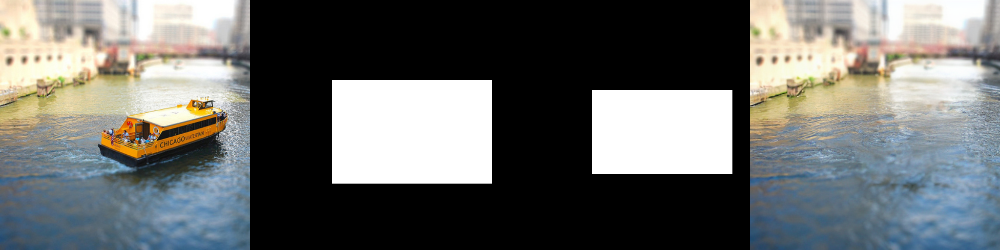

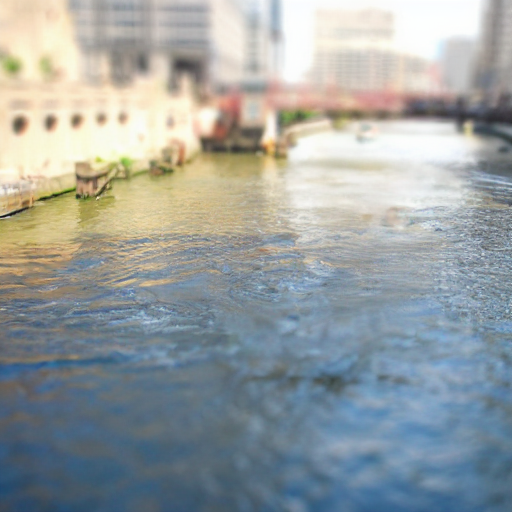

In [9]:
case = "01"
image_source = load_512(f"assets/cases/removal/{case}/source.png")
source_mask = load_512_mask(f"assets/cases/removal/{case}/mask.png")
# origin_prompt and target_prompt can be set specifically for better removal results
remove_image_optimization(pipeline, image_source, num_iters=100, source_mask=source_mask)

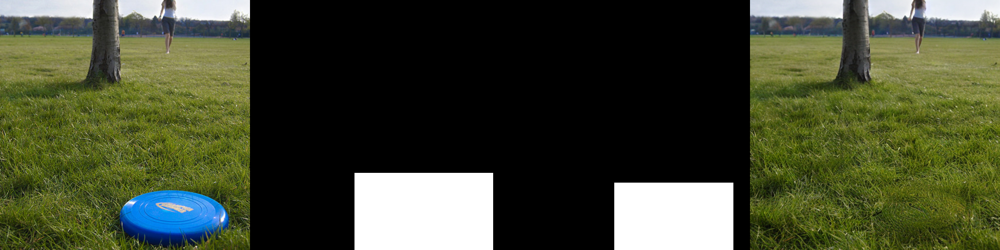

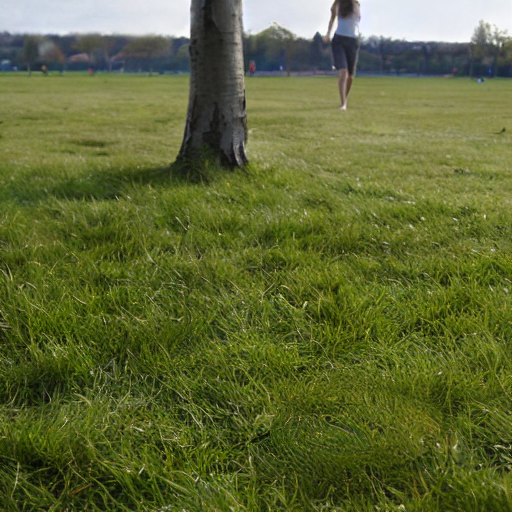

In [10]:
case = "02"
image_source = load_512(f"assets/cases/removal/{case}/source.png")
source_mask = load_512_mask(f"assets/cases/removal/{case}/mask.png")
# origin_prompt and target_prompt can be set specifically for better removal results
remove_image_optimization(pipeline, image_source, num_iters=100, source_mask=source_mask)

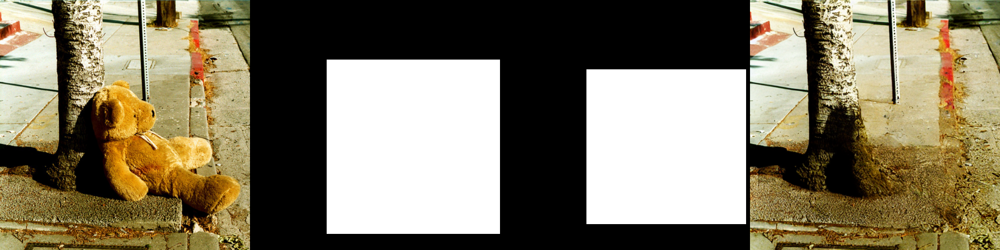

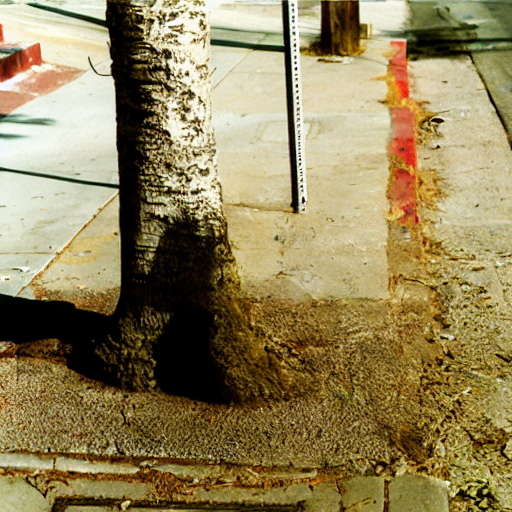

In [11]:
case = "03"
image_source = load_512(f"assets/cases/removal/{case}/source.png")
source_mask = load_512_mask(f"assets/cases/removal/{case}/mask.png")
# origin_prompt and target_prompt can be set specifically for better removal results
remove_image_optimization(pipeline, image_source, num_iters=100, source_mask=source_mask)

### Harmonization

In [21]:
def compose_image_optimization(pipe: StableDiffusionPipeline, image_source_np: np.ndarray, image_target_np:np.ndarray, text: str, num_iters=200, target_mask=None, background_weight=2.5, front_weight=1.5) -> None:    
    
    perceptual_loss = LPIPS().eval().to(device)
    
    dilate_target_mask = cv2.dilate(target_mask, np.ones((5, 5), np.uint8), iterations=5)
    
    target_image_mask = torch.from_numpy(target_mask).float()
    target_image_mask_512 = target_image_mask.clone().detach().reshape(1, 1, 512, 512).repeat(1, 3, 1, 1).to(device, dtype=dtype)
    target_image_mask = torch.nn.functional.interpolate(target_image_mask.unsqueeze(0).unsqueeze(0), size=(64, 64))
    target_image_mask = target_image_mask.repeat(1, 4, 1, 1).to(device, dtype=dtype)
    dilate_target_image_mask = torch.from_numpy(dilate_target_mask).float()
    dilate_target_image_mask_512 = dilate_target_image_mask.clone().detach().reshape(1, 1, 512, 512).repeat(1, 3, 1, 1).to(device, dtype=dtype)
    dilate_target_image_mask = torch.nn.functional.interpolate(dilate_target_image_mask.unsqueeze(0).unsqueeze(0), size=(64, 64))
    dilate_target_image_mask = dilate_target_image_mask.repeat(1, 4, 1, 1).to(device, dtype=dtype)
    
    dds_loss = DDSLoss(device, pipe)

    image_source = torch.from_numpy(image_source_np).float().permute(2, 0, 1) / 127.5 - 1
    image_source = image_source.unsqueeze(0).to(device, dtype=dtype)
    image_target = torch.from_numpy(image_target_np).float().permute(2, 0, 1) / 127.5 - 1
    image_target = image_target.unsqueeze(0).to(device, dtype=dtype)
    
    with torch.no_grad():
        z_target = pipeline.vae.encode(image_target)['latent_dist'].mean * 0.18215
        embedding_null = get_text_embeddings(pipeline, "")
        embedding_source = get_text_embeddings(pipeline, "")
        embedding_target = get_text_embeddings(pipeline, text)
        
        embedding_source = torch.stack([embedding_null, embedding_source], dim=1)
        embedding_target = torch.stack([embedding_null, embedding_target], dim=1)

    target_image_mask_512.requires_grad = False
    front_mask = target_image_mask_512
    background_mask = (torch.ones_like(dilate_target_image_mask_512) - dilate_target_image_mask_512)
    background_target = image_source * background_mask
    background_target.requires_grad = False
    front_target = image_target * front_mask
    front_target.requires_grad = False

    z_target_original = z_target.clone().detach()
    z_target_original.requires_grad = False
    z_target.requires_grad = True
    optimizer = SGD(params=[z_target], lr=5e-2)
    last_latent = z_target.clone().detach()
    last_latent.requires_grad = False

    for i in range(num_iters):
        origin_loss, log_loss = dds_loss.get_dds_loss(z_target_original, z_target, embedding_source, embedding_target)
        
        image_tensor = decode_latent(z_target, pipeline) * 2 - 1
        front_tensor = image_tensor.clone()
        front_tensor = front_tensor * front_mask
        front_loss = perceptual_loss(front_tensor.contiguous(), front_target.contiguous())
        background_tensor = image_tensor.clone()
        background_tensor = background_tensor * background_mask
        background_loss = perceptual_loss(background_tensor.contiguous(), background_target.contiguous())
        
        loss = 5 * origin_loss + background_weight * background_loss + front_weight * front_loss
        
        optimizer.zero_grad()
        (2000 * loss).backward()
        optimizer.step()
        if (i + 1) % 10 == 0:
            out = decode(z_target, pipeline, im_cat=[image_source_np, image_target_np, target_mask * 255, dilate_target_mask * 255])
            clear_output(wait=True)
            display(out)
    
    return decode(z_target, pipeline)


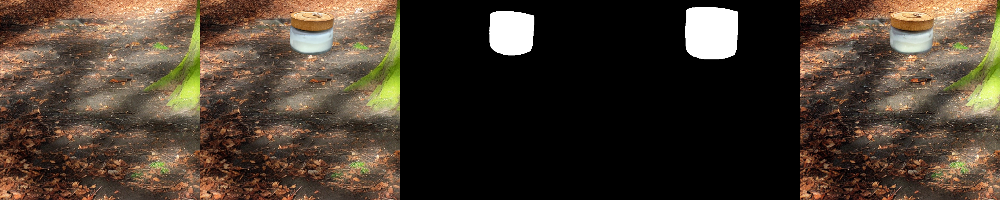

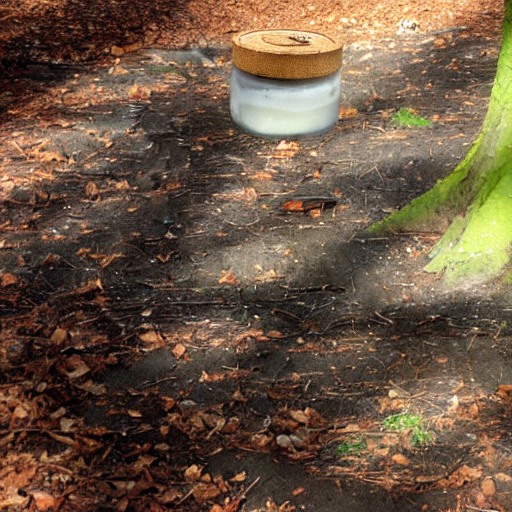

In [14]:
prompt = "something with shadow"
case="01"

image_source = load_512(f"assets/cases/harmonization/{case}/source.png")
image_target = load_512(f"assets/cases/harmonization/{case}/paste.png")
target_mask = load_512_mask(f"assets/cases/harmonization/{case}/paste_mask.png")
compose_image_optimization(pipeline, image_source, image_target, prompt, num_iters=100, target_mask=target_mask)

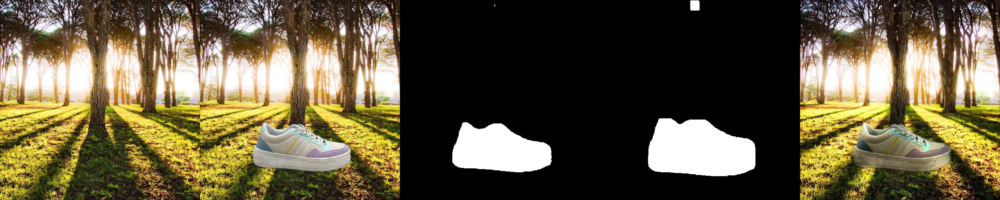

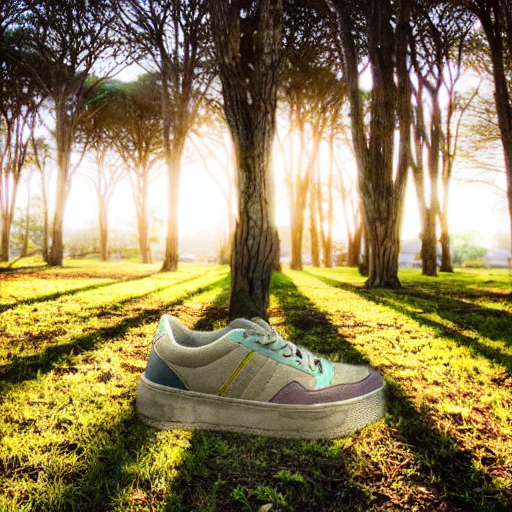

In [15]:
prompt = "something with shadow"
case="02"

image_source = load_512(f"assets/cases/harmonization/{case}/source.png")
image_target = load_512(f"assets/cases/harmonization/{case}/paste.png")
target_mask = load_512_mask(f"assets/cases/harmonization/{case}/paste_mask.png")
compose_image_optimization(pipeline, image_source, image_target, prompt, num_iters=100, target_mask=target_mask)

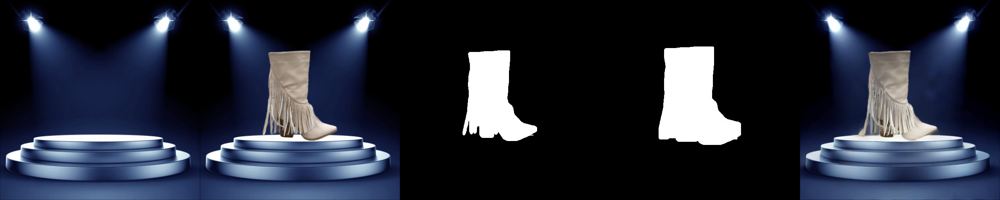

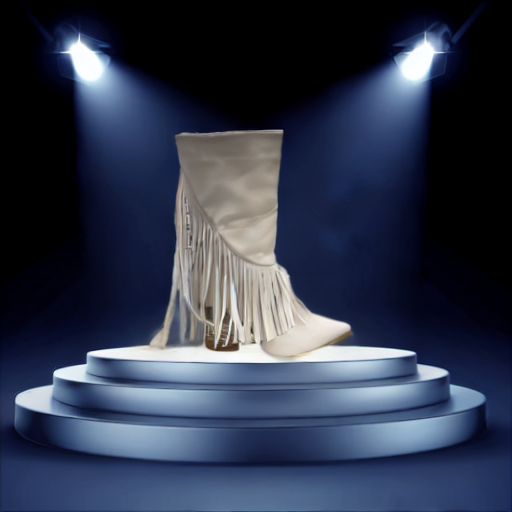

In [22]:
prompt = "something with light and shadow"
case="03"

image_source = load_512(f"assets/cases/harmonization/{case}/source.png")
image_target = load_512(f"assets/cases/harmonization/{case}/paste.png")
target_mask = load_512_mask(f"assets/cases/harmonization/{case}/paste_mask.png")
compose_image_optimization(pipeline, image_source, image_target, prompt, num_iters=100, target_mask=target_mask, front_weight=5)

### Composition

This part is lack of stability, the parameter below can achieve a good result but need to use different seed to find.

An error is that when using sd v2.1, there will be a infinite bug in `get_eps_prediction`, which not appears in v1.5.

In [94]:
def edit_image_optimization(pipe: StableDiffusionPipeline, image: np.ndarray, text_source: str, text_target: str, kind="sketch", num_iters=200, STEP=0, LAYER=10, cond_images=None, cond_scale=0.9, append_images=None) -> None:
    
    pipe2 = copy.deepcopy(pipe)
    editor = KVReplace(STEP, LAYER, total_steps=num_iters)
    register_attention_editor_diffusers(pipe2, editor)
    
    adapter = T2IAdapter.from_pretrained(
        "TencentARC/t2iadapter_sketch_sd15v2" if kind == "sketch" else "TencentARC/t2iadapter_canny_sd15v2",
        torch_dtype=dtype,
    ).to(device)
    dds_loss = DDSLoss(device, pipe2, adapter=adapter, cond_images=cond_images, cond_scale=cond_scale)
    if kind == "sketch":
        dds_loss.t_min = 100
        dds_loss.t_max = 600
    
    image_source = torch.from_numpy(image).float().permute(2, 0, 1) / 127.5 - 1
    image_source = image_source.unsqueeze(0).to(device, dtype=dtype)
    with torch.no_grad():
        z_source = pipeline.vae.encode(image_source)['latent_dist'].mean * 0.18215
        image_target = image_source.clone()
        embedding_null = get_text_embeddings(pipeline, "")
        embedding_text = get_text_embeddings(pipeline, text_source)
        embedding_text_target = get_text_embeddings(pipeline, text_target)
        embedding_source = torch.stack([embedding_null, embedding_text], dim=1)
        embedding_target = torch.stack([embedding_null, embedding_text_target], dim=1)

    image_target.requires_grad = True

    z_taregt = z_source.clone()
    z_taregt.requires_grad = True
    z_target_original = z_taregt.clone().detach()
    z_target_original.requires_grad = False
    optimizer = SGD(params=[z_taregt], lr=5e-2)
    
    for i in range(num_iters):
        if i == num_iters - 50:
            dds_loss.t_min = 50
            dds_loss.t_max = 150
        
        origin_loss, log_loss = dds_loss.get_dds_loss(z_source, z_taregt, embedding_source, embedding_target)
        
        loss = 10 * origin_loss
        
        optimizer.zero_grad()
        (2000 * loss).backward()
        optimizer.step()
        if (i + 1) % 10 == 0:
            out = decode(z_taregt, pipeline, im_cat=[image] + append_images if append_images is not None else [image])
            clear_output(wait=True)
            display(out)
            
    del pipe2
            
    return decode(z_taregt, pipeline)

#### Sketch

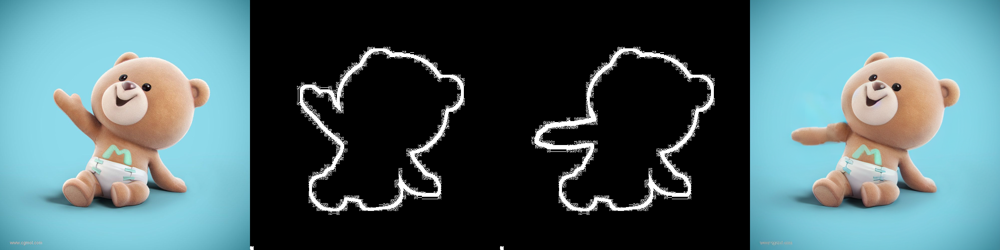

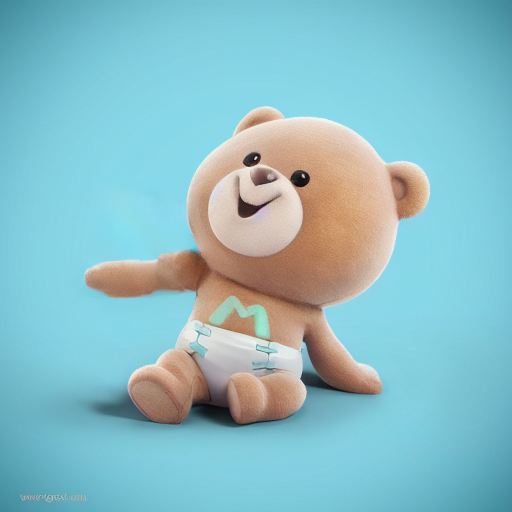

In [67]:
case="01"
image = load_512(f"assets/cases/composition/{case}/source.jpg")
cond1 = load_512_mask(f"assets/cases/composition/{case}/origin_sketch.jpg") * 255
cond2 = load_512_mask(f"assets/cases/composition/{case}/edit_sketch.jpg") * 255
cond_images = [Image.fromarray(cond1), Image.fromarray(cond2)]

edit_image_optimization(
    pipeline, image, 
    "A toy.", "A toy.", 
    num_iters=300,
    STEP=0, LAYER=12,
    cond_images=cond_images,
    cond_scale=1.5,
    append_images=[cond1, cond2]    
)

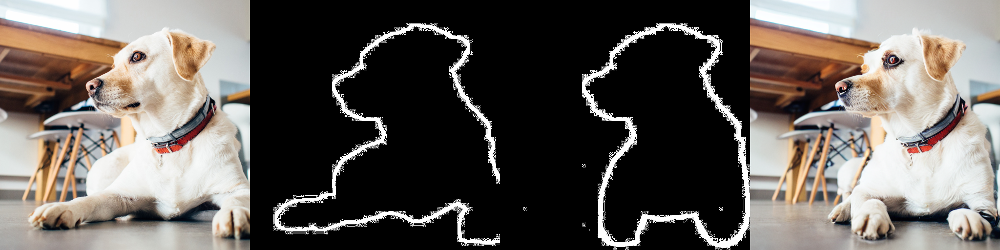

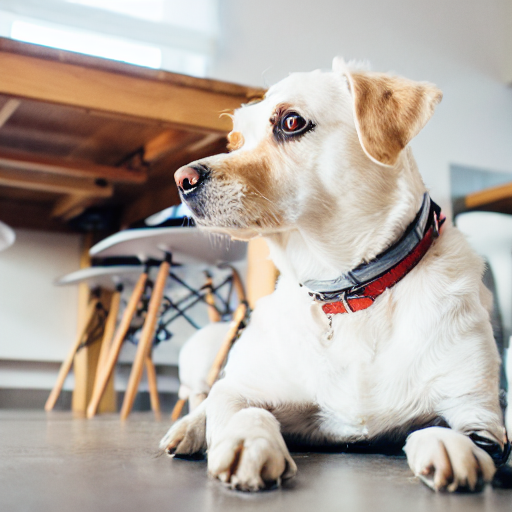

In [55]:
case="02"
image = load_512(f"assets/cases/composition/{case}/source.jpg")
cond1 = load_512_mask(f"assets/cases/composition/{case}/origin_sketch.jpg") * 255
cond2 = load_512_mask(f"assets/cases/composition/{case}/edit_sketch.jpg") * 255
cond_images = [Image.fromarray(cond1), Image.fromarray(cond2)]

edit_image_optimization(
    pipeline, image,
    "A dog lie on the ground", 
    "A dog stand on the ground", 
    num_iters=200,
    STEP=0, LAYER=10,
    cond_images=cond_images,
    cond_scale=1.0,
    append_images=[cond1, cond2]   
)

#### Canny

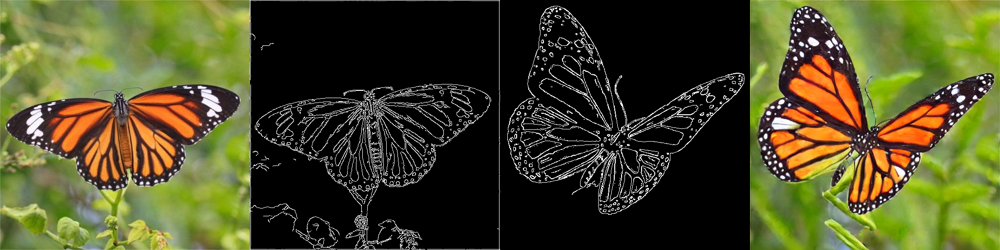

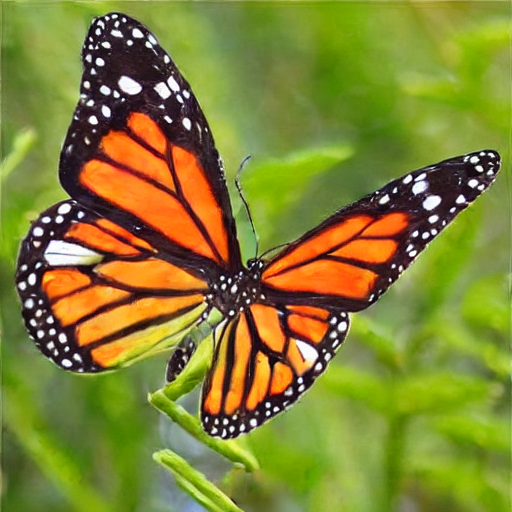

In [95]:
case = "03"
image = load_512(f"assets/cases/composition/{case}/source.jpg")
cond1 = load_512_mask(f"assets/cases/composition/{case}/origin_canny.jpg") * 255
cond2 = load_512_mask(f"assets/cases/composition/{case}/edit_canny.jpg") * 255
cond_images = [Image.fromarray(cond1), Image.fromarray(cond2)]

edit_image_optimization(
    pipeline, image,
    "A butterfly's back side", 
    "A butterfly's lateral side", 
    kind="canny",
    num_iters=200,
    STEP=0, LAYER=12,
    cond_images=cond_images,
    cond_scale=1.0,
    append_images=[cond1, cond2]   
)

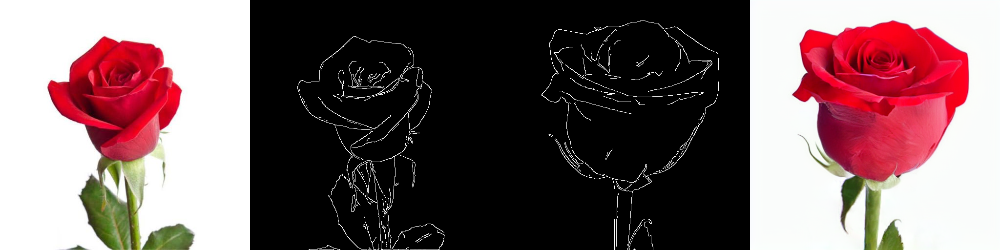

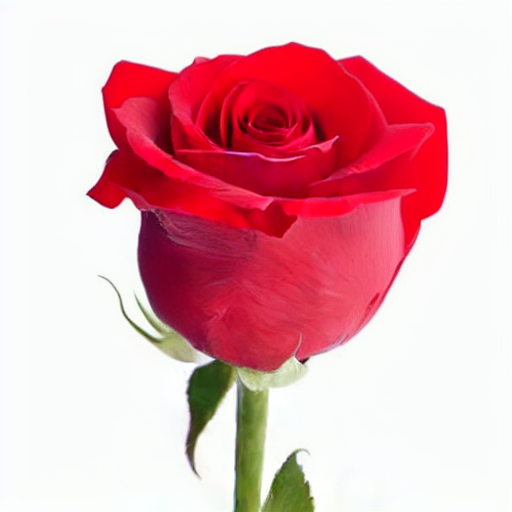

In [92]:
case = "04"
image = load_512(f"assets/cases/composition/{case}/source.jpg")
cond1 = load_512_mask(f"assets/cases/composition/{case}/origin_canny.jpg") * 255
cond2 = load_512_mask(f"assets/cases/composition/{case}/edit_canny.jpg") * 255
cond_images = [Image.fromarray(cond1), Image.fromarray(cond2)]

edit_image_optimization(
    pipeline, image,
    "A rose's up side", 
    "A rose's lateral side", 
    kind="canny",
    num_iters=200,
    STEP=0, LAYER=12,
    cond_images=cond_images,
    cond_scale=1.0,
    append_images=[cond1, cond2]   
)